# Análisis Exploratorio de Datos (EDA) - TFM
# Análisis exploratorio del dataset de Idealista
Este análisis forma parte del Trabajo Fin de Máster (TFM) y tiene como objetivo explorar, limpiar y preparar los datos obtenidos de Idealista. Se busca detectar valores nulos, outliers y patrones relevantes que ayuden a construir un modelo predictivo para el precio de alquiler de viviendas.


## Carga de librerias

In [1]:
## 1. Carga de librerías
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Configuración estética
sns.set(style='whitegrid')

  Using cached numpy-2.0.2-cp312-cp312-win_amd64.whl.metadata (59 kB)
Using cached numpy-2.0.2-cp312-cp312-win_amd64.whl (15.6 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2


## Carga de datos

In [2]:
## 2. Carga de datos

# Cargar datos
dataframe = pd.read_csv("../data/Datos.csv")
dataframe.head()


,provincia,zona,titulo,PrecioActual,PrecioAnterior,metros,habitaciones,ascensor,localizacion,planta,baños,tags,descripcion,Enlace
0,madrid,ciudad-lineal,"Piso en calle de San Marcelo, 22, Ventas, Madrid",355000,0,69,2.0,S,EXTERIOR,5ª,1,"VIVIENDA,LUMINOSO,VISTAS,REFORMADA,PORTERO,EXT...",Particular Vende vivienda totalmente reformada...,https://www.idealista.com/inmueble/106956987/
1,madrid,carabanchel,"Piso en calle Cabo Nicolás Mur, San Isidro, Ma...",149000,159000,91,3.0,N,EXTERIOR,1ª,0,"PISO,EXCLUSIVA,INMOBILIARIA,OPORTUNIDAD",Inmobiliarias Encuentro vende en exclusiva la ...,https://www.idealista.com/inmueble/106906044/
2,madrid,centro,"Piso en calle de Rodas, Lavapiés-Embajadores, ...",195000,0,36,1.0,S,NaN,2ª,0,"EXCLUSIVA,ESTUDIO",ESTUDIO EN PLENO CENTRO DE MADRIDSarago Servic...,https://www.idealista.com/inmueble/107306175/
3,madrid,usera,"Piso en calle de Ferroviarios, Almendrales, Ma...",195000,0,58,1.0,S,INTERIOR,BAJO,0,"VIVIENDA,HOGAR,FUNCIONAL","Esta acogedora vivienda, ubicada en una planta...",https://www.idealista.com/inmueble/106325171/
4,madrid,tetuan,"Dúplex en Bellas Vistas, Madrid",715000,750000,140,3.0,S,EXTERIOR,2ª,0,"TERRAZA,EXCLUSIVA,MODERNO","Maravilloso ATICO de reciente construcción, co...",https://www.idealista.com/inmueble/106627265/


## Caracteristicas dataframe

In [3]:
dataframe.columns

Index(['provincia', 'zona', 'titulo', 'PrecioActual', 'PrecioAnterior',
       'metros', 'habitaciones', 'ascensor', 'localizacion', 'planta', 'baños',
       'tags', 'descripcion', 'Enlace'],
      dtype='object')

In [4]:
# Información general del dataframe
print("INFO DATAFRAME")
dataframe.info()

INFO DATAFRAME
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11826 entries, 0 to 11825
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   provincia       11826 non-null  object 
 1   zona            11826 non-null  object 
 2   titulo          11826 non-null  object 
 3   PrecioActual    11826 non-null  int64  
 4   PrecioAnterior  11826 non-null  int64  
 5   metros          11826 non-null  int64  
 6   habitaciones    11460 non-null  float64
 7   ascensor        11033 non-null  object 
 8   localizacion    10730 non-null  object 
 9   planta          10601 non-null  object 
 10  baños           11826 non-null  int64  
 11  tags            11664 non-null  object 
 12  descripcion     11761 non-null  object 
 13  Enlace          11826 non-null  object 
dtypes: float64(1), int64(4), object(9)
memory usage: 1.3+ MB


In [5]:
# Estadísticas descriptivas
print("Description DATAFRAME")
dataframe.describe()

Description DATAFRAME


,PrecioActual,PrecioAnterior,metros,habitaciones,baños
count,1.182600e+04,1.182600e+04,11826.000000,11460.000000,11826.000000
mean,1.030501e+06,7.359704e+04,153.790039,2.847731,0.394047
std,1.237718e+06,3.639753e+05,766.217750,1.432402,0.882134
min,1.200000e+04,0.000000e+00,11.000000,1.000000,0.000000
25%,2.890000e+05,0.000000e+00,68.000000,2.000000,0.000000
50%,6.200000e+05,0.000000e+00,103.000000,3.000000,0.000000
75%,1.329000e+06,0.000000e+00,160.000000,3.000000,0.000000
max,2.300000e+07,8.450000e+06,75000.000000,20.000000,7.000000


In [6]:
# Comprobación de valores nulos
print("NULL VALUES DATAFRAME")
dataframe.isnull().sum()

NULL VALUES DATAFRAME


provincia            0
zona                 0
titulo               0
PrecioActual         0
PrecioAnterior       0
metros               0
habitaciones       366
ascensor           793
localizacion      1096
planta            1225
baños                0
tags               162
descripcion         65
Enlace               0
dtype: int64

### Función para transformar los valores de planta


In [7]:
def convertir_planta(planta_str):
    if pd.isnull(planta_str):
        return np.nan
    if not isinstance(planta_str, str):
        return np.nan  # No es texto, no podemos procesar

    planta_str = planta_str.lower()

    if 'bajo' in planta_str:
        return 0
    elif 'entresuelo' in planta_str:
        return 0.5
    elif 'sótano' in planta_str or 'semisótano' in planta_str:
        return -1
    elif 'ático' in planta_str:
        return 99
    else:
        match = pd.Series(planta_str).str.extract(r'(\d+)')
        if match.iloc[0, 0] is not None:
            return float(match.iloc[0, 0])
        else:
            return np.nan


Los valores nulos de planta, se añadirán con la mediana 

In [ ]:
# Aplicar conversión a planta_num
dataframe['planta_num'] = dataframe['planta'].apply(convertir_planta)

# Inserción de valores faltantes en planta_num usando la mediana por zona
dataframe['planta_num'] = dataframe.groupby('zona')['planta_num'].transform(
    lambda x: x.fillna(x.median())
)

# Innserción mediante mediana global los valores que siguen siendo nulos
mediana_global = dataframe['planta_num'].median()
dataframe['planta_num'] = dataframe['planta_num'].fillna(mediana_global)
print(dataframe)

      provincia           zona  \
0        madrid  ciudad-lineal   
1        madrid    carabanchel   
2        madrid         centro   
3        madrid          usera   
4        madrid         tetuan   
...         ...            ...   
11821    madrid         centro   
11822    madrid         centro   
11823    madrid         tetuan   
11824    madrid    carabanchel   
11825    madrid       san-blas   

                                                  titulo  PrecioActual  \
0       Piso en calle de San Marcelo, 22, Ventas, Madrid        355000   
1      Piso en calle Cabo Nicolás Mur, San Isidro, Ma...        149000   
2      Piso en calle de Rodas, Lavapiés-Embajadores, ...        195000   
3      Piso en calle de Ferroviarios, Almendrales, Ma...        195000   
4                        Dúplex en Bellas Vistas, Madrid        715000   
...                                                  ...           ...   
11821  Piso en calle del Amparo, Lavapiés-Embajadores...        189000   

### Conversión binaria de la columna ascensor

In [ ]:
dataframe['tiene_ascensor'] = dataframe['ascensor'].apply(lambda x: 1 if x == 'S' else 0)

# Verificar las nuevas columnas
print(dataframe[['tiene_ascensor']].head())

   tiene_ascensor
0               1
1               0
2               1
3               1
4               1


### Eliminación de columnas indiferentes para el modelo
Ya que existen columnas que no nos van a servir para entrenar el modelo, que en este caso serían las siguientes:
* Enlace 
* Descripcion
* tags
* PrecioAnterior
* Titulo
* Provincia

In [10]:
columnas_deseadas = ["zona", "PrecioActual", "metros", "habitaciones", "tiene_ascensor", "localizacion", "planta_num", "baños"]
df_limpio=dataframe[columnas_deseadas]
df_limpio.head()

,zona,PrecioActual,metros,habitaciones,tiene_ascensor,localizacion,planta_num,baños
0,ciudad-lineal,355000,69,2.0,1,EXTERIOR,5.0,1
1,carabanchel,149000,91,3.0,0,EXTERIOR,1.0,0
2,centro,195000,36,1.0,1,NaN,2.0,0
3,usera,195000,58,1.0,1,INTERIOR,0.0,0
4,tetuan,715000,140,3.0,1,EXTERIOR,2.0,0


### Observamos los valores que resultan nulos del dataframe actual

In [ ]:
df_limpio.isnull().sum()

zona                 0
PrecioActual         0
metros               0
habitaciones       366
tiene_ascensor       0
localizacion      1096
planta_num           0
baños                0
dtype: int64

#### Eliminación de los valores nulos restantes

In [12]:
df_limpio = df_limpio.dropna()

In [13]:
len(df_limpio)

10390

In [14]:
df_limpio.columns[df_limpio.isna().any()]

Index([], dtype='object')

In [15]:
df_limpio['planta_num']

0        5.0
1        1.0
3        0.0
4        2.0
5        3.0
        ... 
11821    0.0
11822    2.0
11823    0.0
11824    2.0
11825    0.0
Name: planta_num, Length: 10390, dtype: float64

### Comprobación de la cantidad de valores que toman las columnas

In [16]:
print(df_limpio.nunique())

zona                21
PrecioActual      1744
metros             465
habitaciones        16
tiene_ascensor       2
localizacion         2
planta_num          24
baños                8
dtype: int64


In [17]:
print(df_limpio['tiene_ascensor'].value_counts(dropna=False))
print(df_limpio['localizacion'].value_counts(dropna=False))


tiene_ascensor
1    8112
0    2278
Name: count, dtype: int64
localizacion
EXTERIOR    8870
INTERIOR    1520
Name: count, dtype: int64


### Distribución de columnas

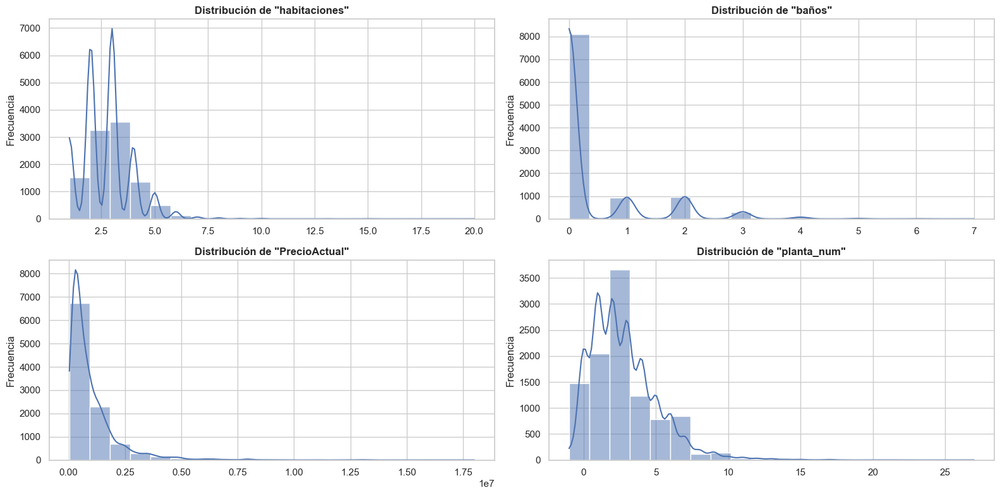

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")

columns = ['habitaciones', 'baños', 'PrecioActual', 'planta_num']

fig, axes = plt.subplots(2, 2, figsize=(16, 8))
axes = axes.flatten()  # Aplanar para iterar fácilmente

# Graficar cada histograma
for ax, col in zip(axes, columns):
    sns.histplot(data=df_limpio, x=col, bins=20, ax=ax, kde=True)
    ax.set_title(f'Distribución de "{col}"', fontsize=12, fontweight='bold')
    ax.set_xlabel('')
    ax.set_ylabel('Frecuencia')

plt.tight_layout()
plt.show()


In [19]:
df_limpio['metros']

0         69
1         91
3         58
4        140
5        135
        ... 
11821     36
11822    245
11823     56
11824     74
11825     54
Name: metros, Length: 10390, dtype: int64

## Boxplot de la variable metros

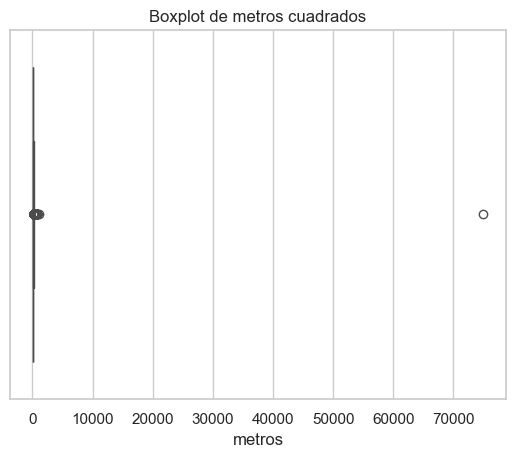

In [20]:
sns.boxplot(x=df_limpio["metros"])
plt.title("Boxplot de metros cuadrados")
plt.show()

### Procederemos a identificar outliers en metros
El gráfico de boxplot indica que la mayoría de las observaciones están concentradas en valores bajos, pero hay al menos un valor que supera los 70.000 m², lo cual probablemente no sea representativo de una vivienda típica y puede estar afectando el análisis.

In [ ]:
q1 = df_limpio["metros"].quantile(0.25)
q3 = df_limpio["metros"].quantile(0.75)
iqr = q3 - q1

limite_inferior = q1 - 1.5 * iqr
limite_superior = q3 + 1.5 * iqr

# Filtrar outliers
outliers = df_limpio[(df_limpio["metros"] < limite_inferior) | (df_limpio["metros"] > limite_superior)]

print(f"Número de outliers: {len(outliers)}")
print(outliers["metros"].sort_values(ascending=False).head())

Número de outliers: 696
6979     75000
280       1139
10277      784
11779      784
827        780
Name: metros, dtype: int64


#### Eliminaremos solo los valores realmente anómalos

In [22]:
df_limpio = df_limpio[df_limpio["metros"] < 1000]


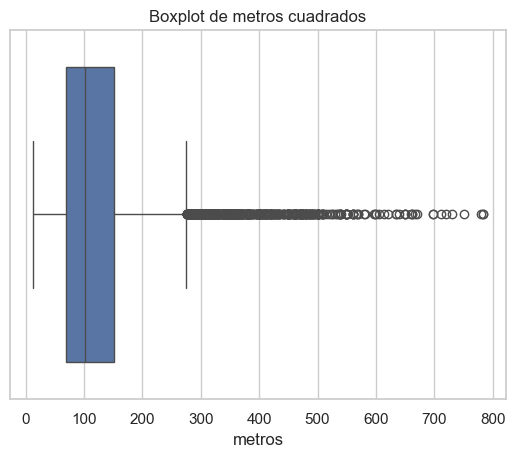

In [23]:
sns.boxplot(x=df_limpio["metros"])
plt.title("Boxplot de metros cuadrados")
plt.show()

## Boxplot de la variable precio actual

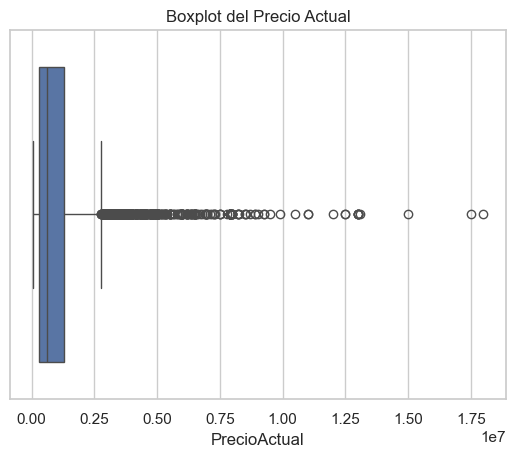

In [24]:
sns.boxplot(x=df_limpio["PrecioActual"])
plt.title("Boxplot del Precio Actual")
plt.show()

### Procederemos a identificar outliers en precioActual
El gráfico de boxplot indica que la mayoría de las observaciones están concentradas varios valores, lo cual probablemente no sea representativo de una vivienda típica y puede estar afectando el análisis.

In [25]:
# Eliminamos precios mayores al percentil 99.5
limite_995 = df_limpio["PrecioActual"].quantile(0.995)
df_limpio = df_limpio[df_limpio["PrecioActual"] < limite_995]

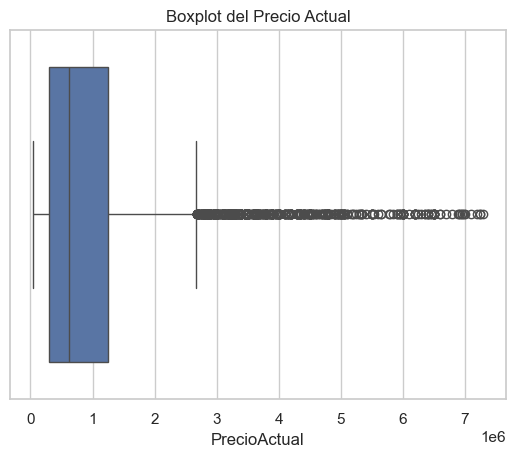

In [26]:
sns.boxplot(x=df_limpio["PrecioActual"])
plt.title("Boxplot del Precio Actual")
plt.show()

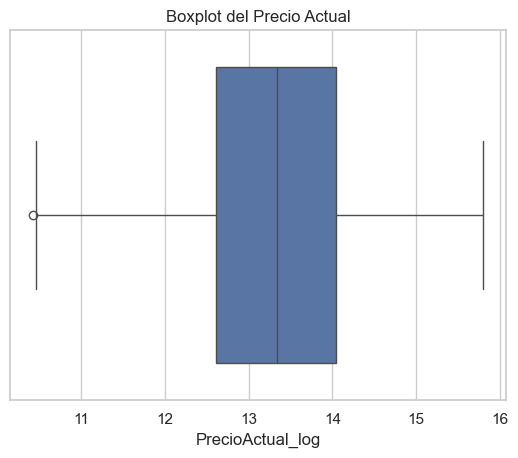

In [27]:
df_limpio["PrecioActual_log"] = np.log1p(df_limpio["PrecioActual"])
sns.boxplot(x=df_limpio["PrecioActual_log"])
plt.title("Boxplot del Precio Actual")
plt.show()

## Distribución Numeros de Pisos vs Metros cuadrados/Precio Actual

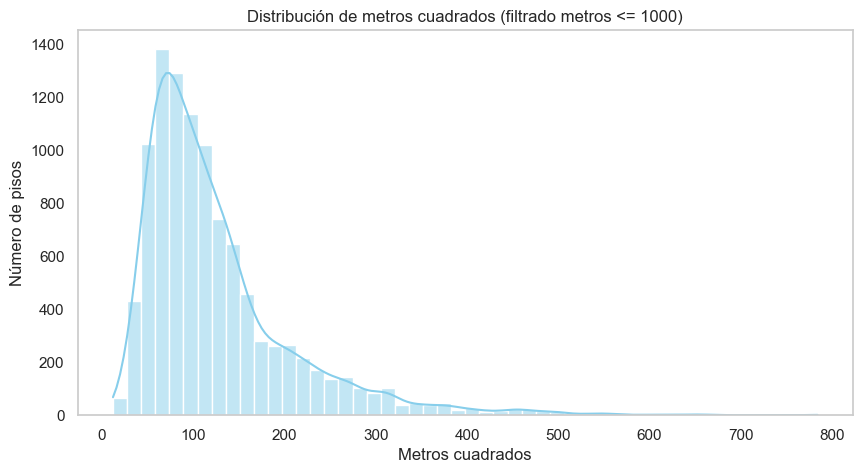

In [28]:
# Visualización de la distribución de metros cuadrados
plt.figure(figsize=(10, 5))
sns.histplot(df_limpio.loc[df_limpio['metros'] <= 1000, 'metros'], bins=50, kde=True, color='skyblue')
plt.title('Distribución de metros cuadrados (filtrado metros <= 1000)')
plt.xlabel('Metros cuadrados')
plt.ylabel('Número de pisos')
plt.grid()
plt.show()


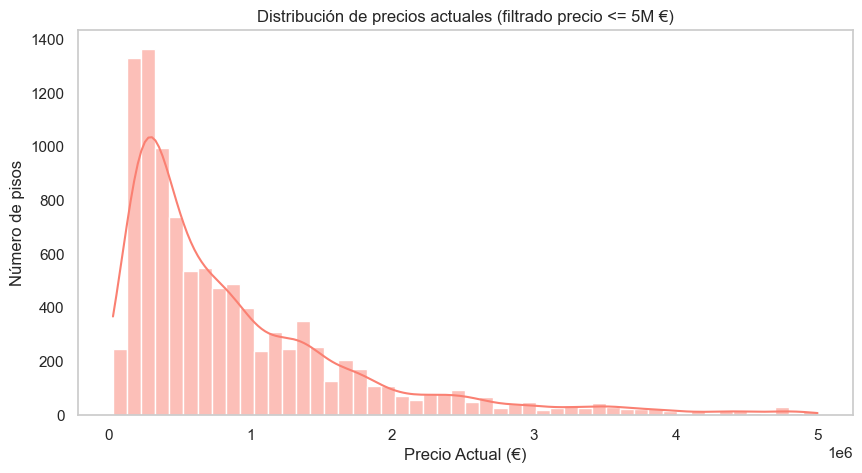

In [29]:

# Visualización de la distribución de precios actuales
plt.figure(figsize=(10, 5))
sns.histplot(df_limpio.loc[df_limpio['PrecioActual'] <= 5000000, 'PrecioActual'], bins=50, kde=True, color='salmon')
plt.title('Distribución de precios actuales (filtrado precio <= 5M €)')
plt.xlabel('Precio Actual (€)')
plt.ylabel('Número de pisos')
plt.grid()
plt.show()

## Comparación PrecioActual vs Metros/Habitaciones/planta/baños

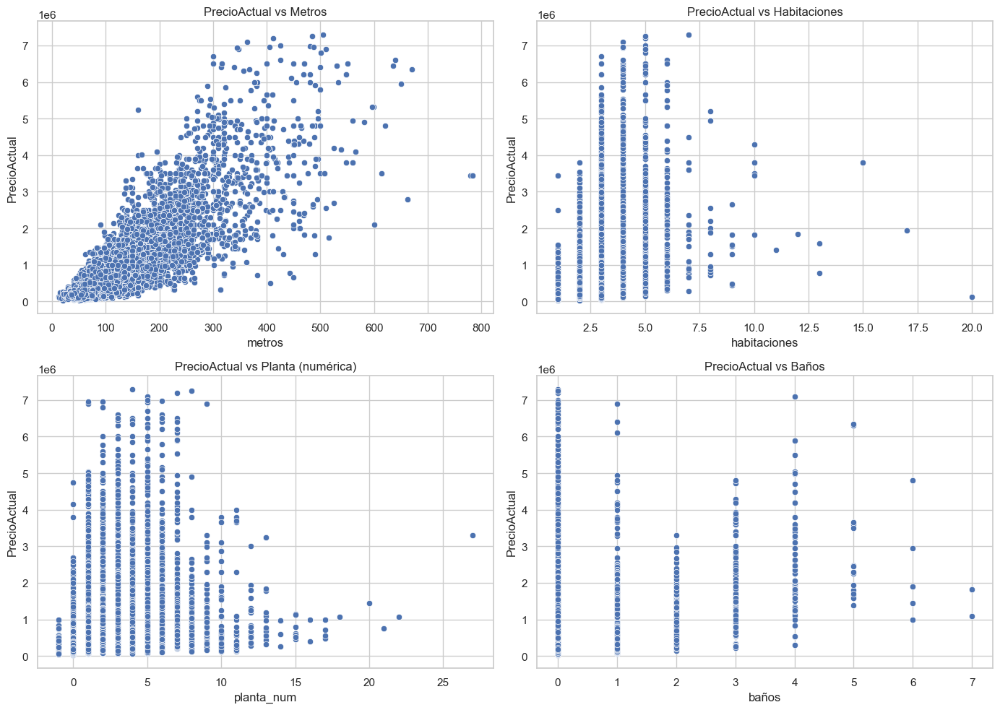

In [ ]:
sns.set(style="whitegrid")

fig, axs = plt.subplots(2, 2, figsize=(14, 10))

# Scatter plot PrecioActual vs metros
sns.scatterplot(x='metros', y='PrecioActual', data=df_limpio, ax=axs[0,0])
axs[0,0].set_title('PrecioActual vs Metros')

# Scatter plot PrecioActual vs habitaciones
sns.scatterplot(x='habitaciones', y='PrecioActual', data=df_limpio, ax=axs[0,1])
axs[0,1].set_title('PrecioActual vs Habitaciones')

# Scatter plot PrecioActual vs planta_num
sns.scatterplot(x='planta_num', y='PrecioActual', data=df_limpio, ax=axs[1,0])
axs[1,0].set_title('PrecioActual vs Planta (numérica)')

# Scatter plot PrecioActual vs baños
sns.scatterplot(x='baños', y='PrecioActual', data=df_limpio, ax=axs[1,1])
axs[1,1].set_title('PrecioActual vs Baños')

plt.tight_layout()
plt.show()

## Violin Plot de PrecioActual por Zona

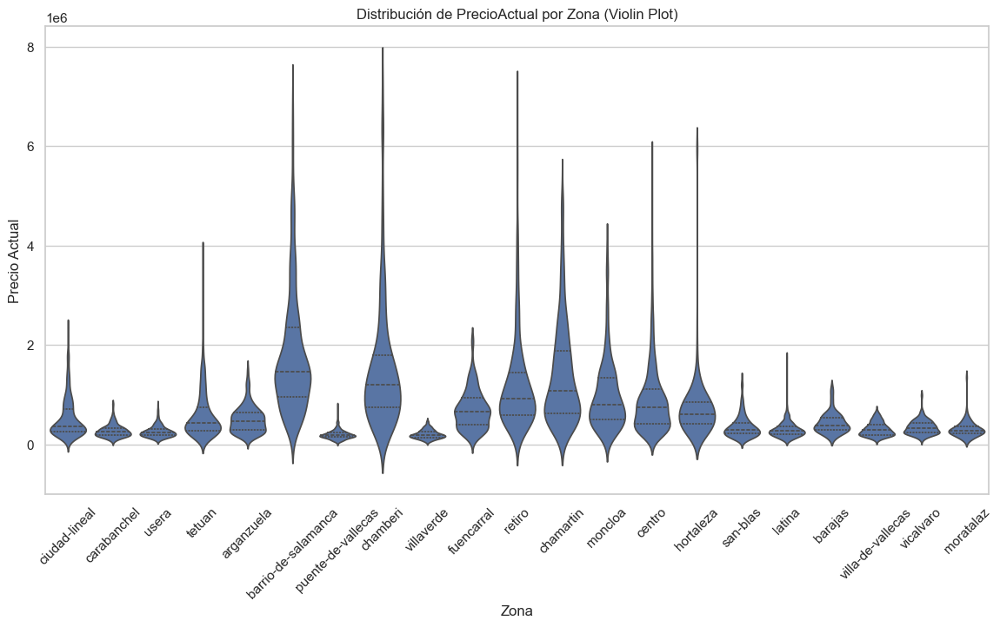

In [31]:
plt.figure(figsize=(14, 7))
sns.violinplot(x='zona', y='PrecioActual', data=df_limpio, inner='quartile', density_norm='width')
plt.xticks(rotation=45)
plt.title('Distribución de PrecioActual por Zona (Violin Plot)')
plt.xlabel('Zona')
plt.ylabel('Precio Actual')
plt.show()

C:\Users\dorti\AppData\Local\Temp\ipykernel_15556\563909279.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_limpio, x='tiene_ascensor', y='PrecioActual', palette='Set2')


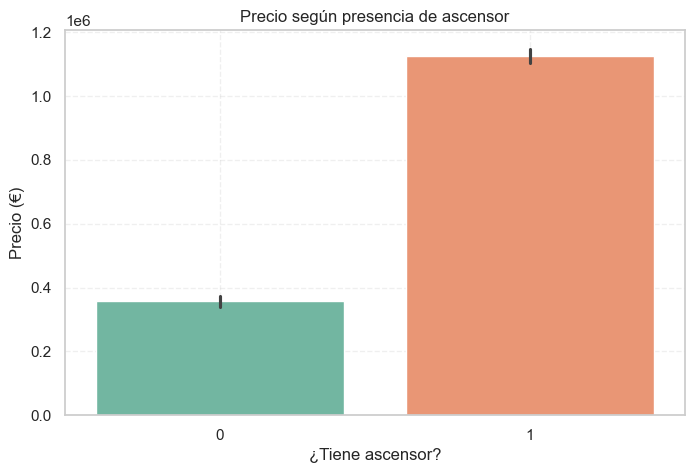

In [ ]:
plt.figure(figsize=(8, 5))
sns.barplot(data=df_limpio, x='tiene_ascensor', y='PrecioActual', palette='Set2')
plt.title("Precio según  ascensor")
plt.xlabel("¿Tiene ascensor?")
plt.ylabel("Precio (€)")
plt.grid(True, linestyle='--', alpha=0.3)
plt.show()

C:\Users\dorti\AppData\Local\Temp\ipykernel_15556\44356102.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_limpio, x='localizacion', y='PrecioActual', palette='Set2')


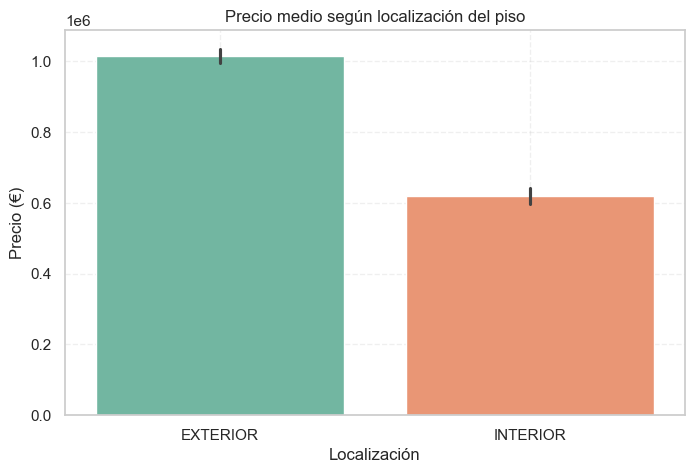

In [48]:
plt.figure(figsize=(8, 5))
sns.barplot(data=df_limpio, x='localizacion', y='PrecioActual', palette='Set2')
plt.title("Precio medio según localización del piso")
plt.xlabel("Localización")
plt.ylabel("Precio (€)")
plt.grid(True, linestyle='--', alpha=0.3)
plt.show()


C:\Users\dorti\AppData\Local\Temp\ipykernel_15556\1287175678.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_limpio, x='metros_rango', y='PrecioActual', palette='Set2')


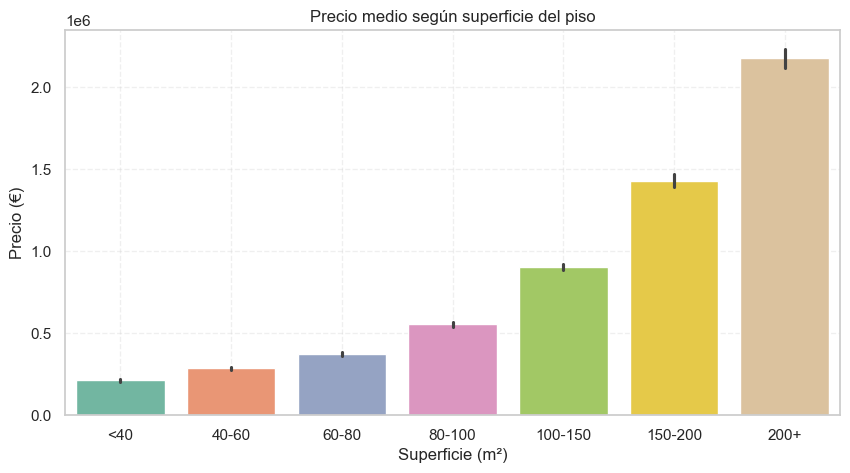

In [47]:
df_limpio['metros_rango'] = pd.cut(df_limpio['metros'], bins=[0, 40, 60, 80, 100, 150, 200, 300], 
                                    labels=['<40', '40-60', '60-80', '80-100', '100-150', '150-200', '200+'])

plt.figure(figsize=(10, 5))
sns.barplot(data=df_limpio, x='metros_rango', y='PrecioActual', palette='Set2')
plt.title("Precio medio según superficie del piso")
plt.xlabel("Superficie (m²)")
plt.ylabel("Precio (€)")
plt.grid(True, linestyle='--', alpha=0.3)
plt.show()


## Obtención de coordenadas de los distritos

In [32]:
!pip install geopy
from geopy.geocoders import Nominatim
from geopy.exc import GeocoderTimedOut
import time

# Datos
data = {
    'zona': ['arganzuela', 'barajas', 'barrio-de-salamanca', 'carabanchel', 'centro', 
             'chamartin', 'chamberi', 'ciudad-lineal', 'fuencarral', 'hortaleza', 
             'latina', 'moncloa', 'moratalaz', 'puente-de-vallecas', 'retiro', 
             'san-blas', 'tetuan', 'usera', 'vicalvaro', 'villa-de-vallecas', 'villaverde']
}

df_geo = pd.DataFrame(data)

# Geocodificador
geolocator = Nominatim(user_agent="geopandas")

# Caché local para evitar múltiples llamadas al mismo lugar
cache = {}

def get_coordinates(zona):
    if zona in cache:
        return cache[zona]
    try:
        location = geolocator.geocode(f"{zona}, Madrid, España", timeout=10)
        if location:
            coords = (location.latitude, location.longitude)
        else:
            coords = (None, None)
    except GeocoderTimedOut:
        coords = (None, None)
    time.sleep(1)  # evitar sobrecargar el servidor
    cache[zona] = coords
    return coords

# Aplicar geocodificación
df_geo[['Latitud', 'Longitud']] = df_geo['zona'].apply(get_coordinates).apply(pd.Series)

# Mostrar el resultado
print(df_geo)


                   zona    Latitud  Longitud
0            arganzuela  40.396954 -3.697289
1               barajas  40.473318 -3.579845
2   barrio-de-salamanca  40.436438 -3.685703
3           carabanchel  40.374211 -3.744676
4                centro  40.417653 -3.707955
5             chamartin  40.473954 -3.682709
6              chamberi  40.438962 -3.705302
7         ciudad-lineal  40.448431 -3.650495
8            fuencarral  40.426213 -3.700993
9             hortaleza  40.472549 -3.642552
10               latina  40.403532 -3.736152
11              moncloa  40.435020 -3.719236
12            moratalaz  40.405933 -3.644874
13   puente-de-vallecas  40.386860 -3.659180
14               retiro  40.411150 -3.676057
15             san-blas  40.427500 -3.615954
16               tetuan  40.460578 -3.698281
17                usera  40.383894 -3.706446
18            vicalvaro  40.401838 -3.595054
19    villa-de-vallecas  40.373958 -3.612163
20           villaverde  40.345610 -3.695956


In [ ]:
# Y que 'df_geo' contiene las columnas 'zona', 'Latitud', 'Longitud'
df_limpio = df_limpio.merge(df_geo, on='zona', how='left')
# Ahora dataframe_limpio tiene todas las columnas originales más 'Latitud' y 'Longitud'
print(df_limpio.head())


            zona  PrecioActual  metros  habitaciones  tiene_ascensor  \
0  ciudad-lineal        355000      69           2.0               1   
1    carabanchel        149000      91           3.0               0   
2          usera        195000      58           1.0               1   
3         tetuan        715000     140           3.0               1   
4     arganzuela       1257000     135           3.0               1   

  localizacion  planta_num  baños  PrecioActual_log    Latitud  Longitud  
0     EXTERIOR         5.0      1         12.779876  40.448431 -3.650495  
1     EXTERIOR         1.0      0         11.911708  40.374211 -3.744676  
2     INTERIOR         0.0      0         12.180760  40.383894 -3.706446  
3     EXTERIOR         2.0      0         13.480039  40.460578 -3.698281  
4     EXTERIOR         3.0      0         14.044239  40.396954 -3.697289  


In [34]:
# Copia del dataframe original limpio
df = df_limpio.copy()

# Eliminamos columnas irrelevantes
df = df.drop(columns=[
    'outlier'], errors='ignore')

# Columnas categóricas a codificar
#columnas_dummies = ['zona','localizacion']
#df = pd.get_dummies(df, columns=columnas_dummies, drop_first=True)

# Comprobamos y eliminamos filas con valores nulos
#df = df.dropna()

# Confirmamos estructura final
#df.info()

In [35]:
# Eliminamos una de cada par
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10336 entries, 0 to 10335
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   zona              10336 non-null  object 
 1   PrecioActual      10336 non-null  int64  
 2   metros            10336 non-null  int64  
 3   habitaciones      10336 non-null  float64
 4   tiene_ascensor    10336 non-null  int64  
 5   localizacion      10336 non-null  object 
 6   planta_num        10336 non-null  float64
 7   baños             10336 non-null  int64  
 8   PrecioActual_log  10336 non-null  float64
 9   Latitud           10336 non-null  float64
 10  Longitud          10336 non-null  float64
dtypes: float64(5), int64(4), object(2)
memory usage: 888.4+ KB


In [36]:
# Copia para EDA
df_eda = df.copy()

# Convertir booleanos a int (mejor para visualizaciones con seaborn o matplotlib)
df_eda = df_eda.astype({col: int for col in df_eda.select_dtypes('bool').columns})

# Verificamos
df_eda.info()
df_eda.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10336 entries, 0 to 10335
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   zona              10336 non-null  object 
 1   PrecioActual      10336 non-null  int64  
 2   metros            10336 non-null  int64  
 3   habitaciones      10336 non-null  float64
 4   tiene_ascensor    10336 non-null  int64  
 5   localizacion      10336 non-null  object 
 6   planta_num        10336 non-null  float64
 7   baños             10336 non-null  int64  
 8   PrecioActual_log  10336 non-null  float64
 9   Latitud           10336 non-null  float64
 10  Longitud          10336 non-null  float64
dtypes: float64(5), int64(4), object(2)
memory usage: 888.4+ KB


,zona,PrecioActual,metros,habitaciones,tiene_ascensor,localizacion,planta_num,baños,PrecioActual_log,Latitud,Longitud
0,ciudad-lineal,355000,69,2.0,1,EXTERIOR,5.0,1,12.779876,40.448431,-3.650495
1,carabanchel,149000,91,3.0,0,EXTERIOR,1.0,0,11.911708,40.374211,-3.744676
2,usera,195000,58,1.0,1,INTERIOR,0.0,0,12.180760,40.383894,-3.706446
3,tetuan,715000,140,3.0,1,EXTERIOR,2.0,0,13.480039,40.460578,-3.698281
4,arganzuela,1257000,135,3.0,1,EXTERIOR,3.0,0,14.044239,40.396954,-3.697289


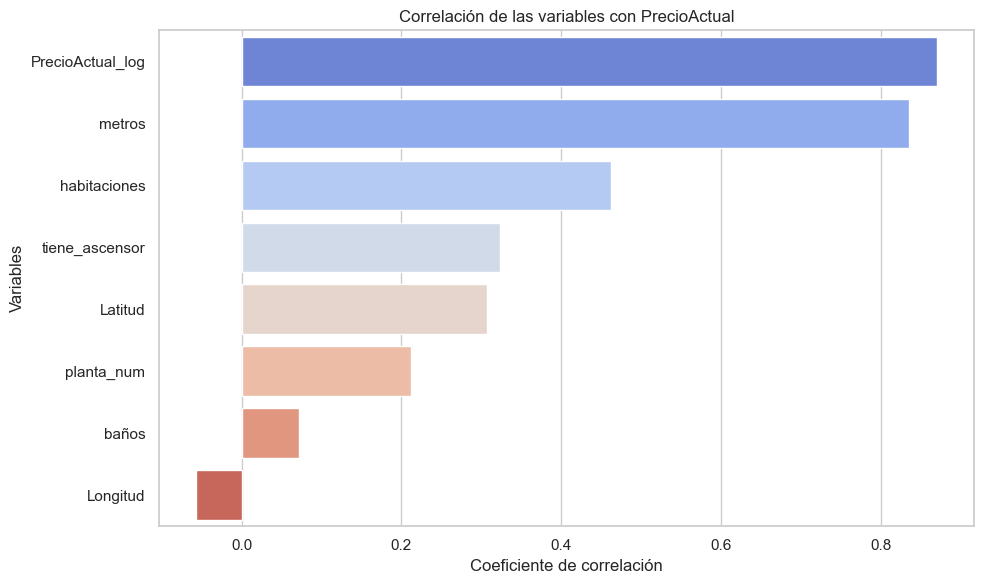

In [37]:
# Filtra solo las columnas numéricas
df_numeric = df_eda.select_dtypes(include=[np.number])

# Calcula la matriz de correlación solo con columnas numéricas
correlation_matrix = df_numeric.corr()

# Extrae la correlación con 'PrecioActual', excluyendo él mismo
correlaciones = correlation_matrix['PrecioActual'].drop('PrecioActual')

# Ordena de mayor a menor
correlaciones_ordenadas = correlaciones.sort_values(ascending=False).reset_index()
correlaciones_ordenadas.columns = ['Variable', 'Correlacion']

# Gráfico
plt.figure(figsize=(10, 6))
sns.barplot(
    data=correlaciones_ordenadas,
    x='Correlacion',
    y='Variable',
    hue='Variable',
    palette='coolwarm',
    dodge=False,
    legend=False
)

plt.title('Correlación de las variables con PrecioActual')
plt.xlabel('Coeficiente de correlación')
plt.ylabel('Variables')
plt.tight_layout()
plt.show()


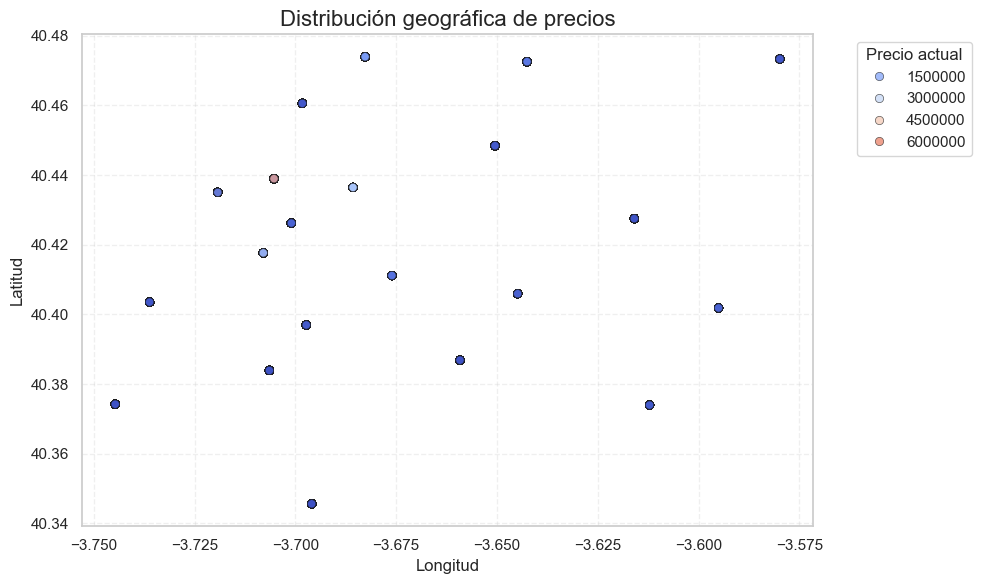

In [38]:
plt.figure(figsize=(10, 6))
scatter = sns.scatterplot(
    data=df_eda,
    x='Longitud',
    y='Latitud',
    hue='PrecioActual',
    palette='coolwarm',
    alpha=0.7,
    edgecolor='k',
    linewidth=0.5
)

plt.title("Distribución geográfica de precios", fontsize=16)
plt.xlabel("Longitud", fontsize=12)
plt.ylabel("Latitud", fontsize=12)
plt.legend(title="Precio actual", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()


In [ ]:
import folium
from folium.plugins import MarkerCluster
import pandas as pd
import numpy as np

centro = [df_eda['Latitud'].mean(), df_eda['Longitud'].mean()]

mapa = folium.Map(location=centro, zoom_start=12, tiles='CartoDB positron')

min_precio = df_eda['PrecioActual'].min()
max_precio = df_eda['PrecioActual'].max()
colormap = folium.LinearColormap(colors=['blue', 'green', 'yellow', 'red'],
                                  vmin=min_precio, vmax=max_precio,
                                  caption='Precio Actual')

marker_cluster = MarkerCluster().add_to(mapa)

# Añadir los marcadores al mapa
for _, row in df_eda.iterrows():
    precio = row['PrecioActual']
    color = colormap(precio)
    folium.CircleMarker(
        location=[row['Latitud'], row['Longitud']],
        radius=5,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.8,
        popup=f"Precio: {precio:.2f}€"
    ).add_to(marker_cluster)

# Añadir la leyenda
colormap.add_to(mapa)

# Mostrar el mapa
mapa


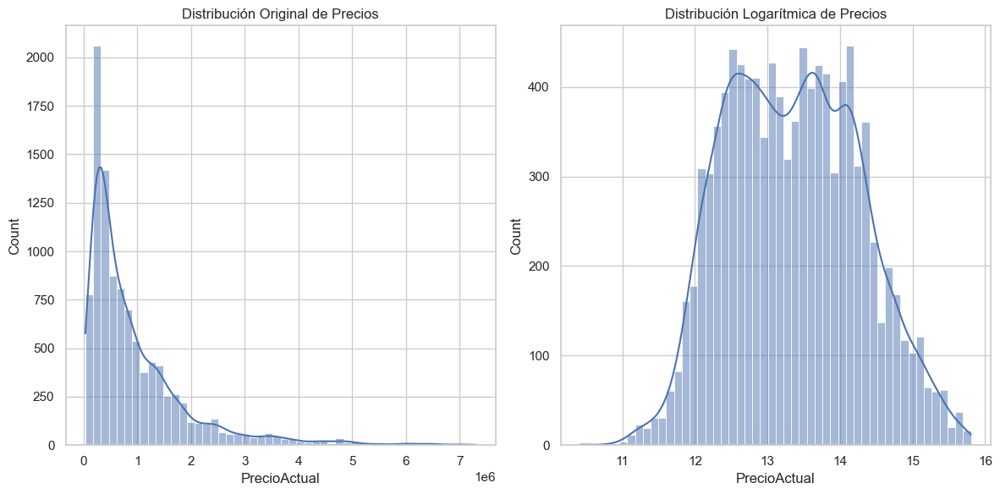

In [40]:
# 1. Análisis de distribución logarítmica del precio
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.histplot(df['PrecioActual'], bins=50, kde=True)
plt.title('Distribución Original de Precios')

plt.subplot(1,2,2)
sns.histplot(np.log1p(df['PrecioActual']), bins=50, kde=True)
plt.title('Distribución Logarítmica de Precios')
plt.tight_layout()
plt.show()

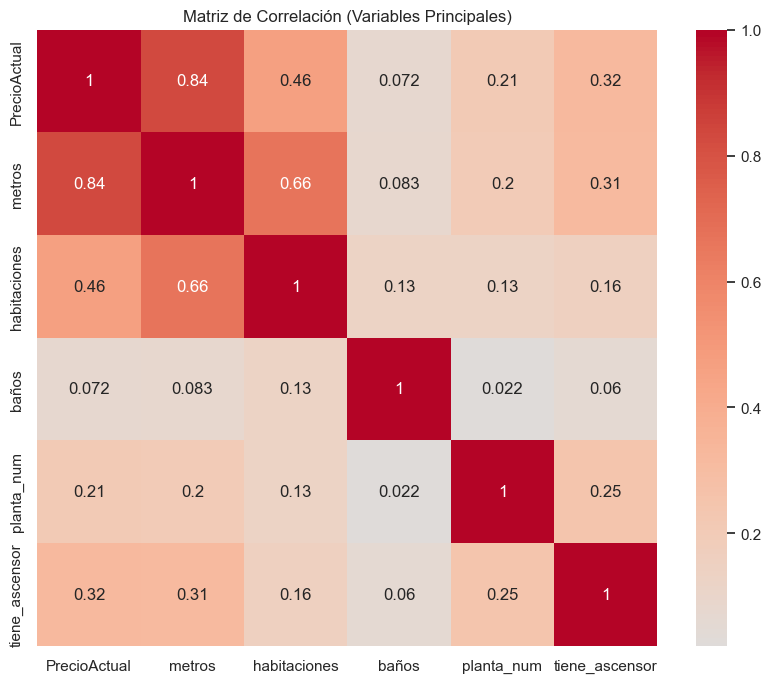

In [41]:
# 4. Matriz de correlación mejorada (solo variables clave)
corr_vars = ['PrecioActual', 'metros', 'habitaciones', 'baños', 'planta_num','tiene_ascensor']
plt.figure(figsize=(10,8))
sns.heatmap(df[corr_vars].corr(), annot=True, cmap='coolwarm', center=0)
plt.title('Matriz de Correlación (Variables Principales)')
plt.show()

In [42]:
# 3. Guardar dataset listo para modelado con todas las transformaciones
df.to_csv("../data/datos_limpios_eda.csv", index=False)